In [2]:
#!apt update && apt install -y libsm6 libxext6
#!apt-get install libsm6 libxrender1 libfontconfig1 -y
#!pip install opencv-python
#!pip install pandas
#!pip install Pillow
#!pip install matplotlib
#!pip install lyft_dataset_sdk
#!pip install moviepy
#!pip install nuscenes-devkit
#!pip install shapely -U

In [3]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
from IPython.display import HTML

In [4]:
import pdb
import cv2
import pandas as pd
import numpy as np
from PIL import Image
from pathlib import Path
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import axes3d, Axes3D

# Load the SDK
from lyft_dataset_sdk.lyftdataset import LyftDataset, LyftDatasetExplorer, Quaternion, view_points
from lyft_dataset_sdk.utils.data_classes import LidarPointCloud

from moviepy.editor import ImageSequenceClip
from tqdm import tqdm_notebook as tqdm

%matplotlib inline

# The dataset structure
scene - 25-45 seconds snippet of a car's journey.

sample - An annotated snapshot of a scene at a particular timestamp.

sample_data - Data collected from a particular sensor.

sample_annotation - An annotated instance of an object within our interest.

instance - Enumeration of all object instance we observed.

category - Taxonomy of object categories (e.g. vehicle, human).

attribute - Property of an instance that can change while the category remains the same.

visibility - (currently not used)

sensor - A specific sensor type.

calibrated sensor - Definition of a particular sensor as calibrated on a particular vehicle.

ego_pose - Ego vehicle poses at a particular timestamp.

log - Log information from which the data was extracted.

map - Map data that is stored as binary semantic masks from a top-down view.

In [5]:
ls -l

total 89119512
-rw-r--r-- 1 root root 91110373250 Nov  1 08:09 3d-object-detection-for-autonomous-vehicles.zip
lrwxrwxrwx 1 root root          12 Nov  1 09:17 data -> ./train_data/
lrwxrwxrwx 1 root root          14 Nov  1 09:17 images -> ./train_images/
-rw-r--r-- 1 root root         616 Nov  1 07:43 kaggle_download.py
lrwxrwxrwx 1 root root          13 Nov  1 09:17 lidar -> ./train_lidar/
-rw-r--r-- 1 root root    39507164 Nov  5 09:02 lyft_data_EDA.ipynb
-rw-r--r-- 1 root root         555 Nov  5 03:29 lyft_exe.ipynb
lrwxrwxrwx 1 root root          12 Nov  1 09:17 maps -> ./train_maps/
-rw-r--r-- 1 root root    13789027 Nov  5 04:23 pcl_data.gif
-rw-r--r-- 1 root root     1812908 Sep 12 01:20 sample_submission.csv
drwxr-xr-x 2 root root        4096 Nov  1 08:18 test_data/
drwxr-xr-x 2 root root    13406208 Nov  1 08:21 test_images/
drwxr-xr-x 2 root root     1957888 Nov  1 08:26 test_lidar/
drwxr-xr-x 2 root root        4096 Nov  1 08:26 test_maps/
drwxr-xr-x 2 root root        4096 

In [6]:
!ln -s ./train_images images
!ln -s ./train_maps maps
!ln -s ./train_lidar lidar
!ln -s ./train_data data

ln: failed to create symbolic link 'images/train_images': File exists
ln: failed to create symbolic link 'maps/train_maps': File exists
ln: failed to create symbolic link 'lidar/train_lidar': File exists
ln: failed to create symbolic link 'data/train_data': File exists


In [7]:
lyftdata = LyftDataset(data_path='.', json_path='data/', verbose=True)

9 category,
18 attribute,
4 visibility,
18421 instance,
10 sensor,
148 calibrated_sensor,
177789 ego_pose,
180 log,
180 scene,
22680 sample,
189504 sample_data,
638179 sample_annotation,
1 map,
Done loading in 9.1 seconds.
Reverse indexing ...
Done reverse indexing in 3.9 seconds.


In [8]:
lyftdata.category

[{'description': '',
  'token': '8eccddb83fa7f8f992b2500f2ad658f65c9095588f3bc0ae338d97aff2dbcb9c',
  'name': 'car'},
 {'description': '',
  'token': '73e8de69959eb9f5b4cd2859e74bec4b5491417336cad63f27e8edb8530ffbf8',
  'name': 'pedestrian'},
 {'description': '',
  'token': 'f81f51e1897311b55c0c6247c3db825466733e08df687c0ea830b026316a1c12',
  'name': 'animal'},
 {'description': '',
  'token': 'a8619a81f5acc7da2a2f034420db2b2f43a015c8c689822e5295b5d6f7a5d8d6',
  'name': 'other_vehicle'},
 {'description': '',
  'token': '7ea5868735dc408109bfa74fd139bd8c5aa3767b52e054b8e792cabcf309c6f4',
  'name': 'bus'},
 {'description': '',
  'token': '1248d937c7a1a2eb1022ba9e806ebd5183b6c20c7f5703d8a7320600f1caad27',
  'name': 'motorcycle'},
 {'description': '',
  'token': '8af78d27e148a8f544f4c86b2a3f4bd6192b975d1065dd932ebdb8879778e275',
  'name': 'truck'},
 {'token': 'c4e92c2b854fb03382838643c36d01a349f5624a11f184042d91d916d19acdbd',
  'description': '',
  'name': 'emergency_vehicle'},
 {'descriptio

In [9]:
cat_token = lyftdata.category[0]['token']
cat_token

'8eccddb83fa7f8f992b2500f2ad658f65c9095588f3bc0ae338d97aff2dbcb9c'

In [10]:
lyftdata.get('category', cat_token)

{'description': '',
 'token': '8eccddb83fa7f8f992b2500f2ad658f65c9095588f3bc0ae338d97aff2dbcb9c',
 'name': 'car'}

In [11]:
lyftdata.sample_annotation[1]

{'token': '04c4c9883de582c5c4e7a45273a978a52b0432de18883f60e7dd0e5cd2137628',
 'num_lidar_pts': -1,
 'size': [1.635, 4.339, 1.515],
 'sample_token': 'edf37c1fb1024ba0c1f53ebbf10b6797f781199a9f0e4e25274df2448966d929',
 'rotation': [-0.9603683930256266, 0, 0, 0.2787338330331926],
 'prev': 'fadeb42661a9af6ff36d3ee60bb68b01a03c59e83bdcdcb227d70c426785bfd0',
 'translation': [1208.642684768659, 1585.1812946970927, -23.56236391728106],
 'num_radar_pts': 0,
 'attribute_tokens': ['7fc1ca3d36808cd1858e9c01ad4e7630ff3ca9e720065034abd244122646acc8'],
 'next': '1b29baa915a0e1835b322e83efe0cfaa9b483fa96e1b34cef73ec95d5b035e5d',
 'instance_token': 'c3824f5ed11d382a4742d00a3a2e8deea4e6c21198151c94d371f6576d2735ed',
 'visibility_token': '',
 'category_name': 'car'}

# Attributes

In [12]:
lyftdata.get('attribute', lyftdata.sample_annotation[0]['attribute_tokens'][0])

{'description': '',
 'token': '1ba8c9a8bda54423fa710b0af1441d849ecca8ed7b7f9393ba1794afe4aa6aa2',
 'name': 'object_action_stopped'}

In [13]:
lyftdata.list_attributes()

is_stationary: 321981
object_action_abnormal_or_traffic_violation: 2
object_action_driving_straight_forward: 244805
object_action_gliding_on_wheels: 165
object_action_lane_change_left: 1463
object_action_lane_change_right: 1370
object_action_left_turn: 5074
object_action_loss_of_control: 1
object_action_other_motion: 582
object_action_parked: 257939
object_action_reversing: 278
object_action_right_turn: 6694
object_action_running: 621
object_action_sitting: 586
object_action_standing: 5332
object_action_stopped: 94970
object_action_u_turn: 407
object_action_walking: 17890


In [2]:
# check how an attribute may change over one scene
for my_instance in lyftdata.instance:
    first_token = my_instance['first_annotation_token']
    last_token = my_instance['last_annotation_token']
    nbr_samples = my_instance['nbr_annotations']
    current_token = first_token

    i = 0
    found_change = False
    while current_token != last_token:
        current_ann = lyftdata.get('sample_annotation', current_token)
        current_attr = lyftdata.get('attribute', current_ann['attribute_tokens'][0])['name']

        if i == 0:
            pass
        elif current_attr != last_attr:
            print("Changed from `{}` to `{}` at timestamp {} out of {} annotated timestamps".format(last_attr, current_attr, i, nbr_samples))
            found_change = True

        next_token = current_ann['next']
        current_token = next_token
        last_attr = current_attr
        i += 1

# Scenes

In [15]:
# list scenes
lyftdata.list_scenes()

host-a007-lidar0-1230485630199365106-12304856550990... [19-01-02 17:33:50]   25s, Palo Alto, #anns:1559
host-a007-lidar0-1230672860198383106-12306728850991... [19-01-04 21:34:20]   25s, Palo Alto, #anns:2969
host-a007-lidar0-1230936221299185986-12309362461986... [19-01-07 22:43:41]   25s, Palo Alto, #anns:683
host-a007-lidar0-1231093036199514746-12310930610996... [19-01-09 18:17:16]   25s, Palo Alto, #anns:3117
host-a009-lidar0-1231200854198312986-12312008790984... [19-01-11 00:14:14]   25s, Palo Alto, #anns:681
host-a005-lidar0-1231201437298603426-12312014621988... [19-01-11 00:23:57]   25s, Palo Alto, #anns:3064
host-a011-lidar0-1232401360198078026-12324013850983... [19-01-24 21:42:40]   25s, Palo Alto, #anns:3842
host-a011-lidar0-1232412236198491106-12324122610982... [19-01-25 00:43:56]   25s, Palo Alto, #anns:372
host-a007-lidar0-1232470052198454586-12324700770988... [19-01-25 16:47:32]   25s, Palo Alto, #anns:1614
host-a011-lidar0-1232485958298280666-12324859832000... [19-01-25 21

In [16]:
lyftdata.scene[0]

{'log_token': 'da4ed9e02f64c544f4f1f10c6738216dcb0e6b0d50952e158e5589854af9f100',
 'first_sample_token': '24b0962e44420e6322de3f25d9e4e5cc3c7a348ec00bfa69db21517e4ca92cc8',
 'name': 'host-a101-lidar0-1241893239199111666-1241893264098084346',
 'description': '',
 'last_sample_token': '2346756c83f6ae8c4d1adec62b4d0d31b62116d2e1819e96e9512667d15e7cec',
 'nbr_samples': 126,
 'token': 'da4ed9e02f64c544f4f1f10c6738216dcb0e6b0d50952e158e5589854af9f100'}

In [17]:
train = pd.read_csv('./train.csv')
train.head()

,Id,PredictionString
0,db8b47bd4ebdf3b3fb21598bb41bd8853d12f8d2ef25ce...,2680.2830359778527 698.1969292852777 -18.04776...
1,edf37c1fb1024ba0c1f53ebbf10b6797f781199a9f0e4e...,1208.642684768659 1585.1812946970927 -23.56236...
2,1841b7895e7163a2c1be87e8c1740e759a910cd59157b8...,848.9346793681768 2587.2870557176507 -20.15995...
3,a970c764e7abd7ebc2cc4599a6e3ae58c9773ea3c9cf1d...,1994.4320280494098 1128.30164336183 -18.054752...
4,b909de93ba19460eeea58074ccc1ef6bb302435f37b48c...,1030.3877156973385 1667.13131694941 -23.764820...


In [18]:
token0 = train.iloc[0]['Id']
token0

'db8b47bd4ebdf3b3fb21598bb41bd8853d12f8d2ef25ce76edd4af4d04e49341'

# Samples

In [19]:
my_sample = lyftdata.get('sample', token0)
my_sample

{'next': 'd68e30dca1dadc71d6f15ed9c7f35cadc9c795e74fc721d668baf9753c07089e',
 'prev': 'cf9e605d1b1a1bc8d8340ad79f49c4993d75fa4171d2cad99d11a0dca5923cd5',
 'token': 'db8b47bd4ebdf3b3fb21598bb41bd8853d12f8d2ef25ce76edd4af4d04e49341',
 'scene_token': 'a9a990d6d215b494a939fba57385566732b9ce0b44b2a000fd23cc25d71cf075',
 'timestamp': 1558109692502687.0,
 'data': {'CAM_FRONT': 'bf374e60b6a1b0b9d4c0e3cf9e92b1f5d8401eae774ec1ebb3aa2f6bee59d1e5',
  'CAM_BACK_LEFT': '521ca50fff810fcb6f70170f6a6b48709e55164902e34df1e8e3d95b5b56572e',
  'CAM_FRONT_RIGHT': 'e35731e7cc91018cbafd323f635d97ccbd948642c19937b85521bd2f9918efcc',
  'CAM_BACK': '762f245c3f3a0cfe3a9bc97eb321eb71522eaff0904469693b9c712041fcf0a1',
  'CAM_BACK_RIGHT': '89ef38638f8f4cbd932f693e934c4022681de809417a50679c9b20914286efb5',
  'LIDAR_FRONT_RIGHT': '0d3a497e9c99f8a4697e0e9d2644a8a7e3bd20143b58dba8285b63dd1715b794',
  'CAM_FRONT_LEFT': 'a8b62cfacbdb74d34051f2ace4e3e89c8eb19bab1c8830ab16a5b671a3bc9971',
  'LIDAR_TOP': 'f2f0d25a268a7a7112

# 3D interactive visualization of a sample

In [3]:
lyftdata.render_sample_3d_interactive(my_sample['token'], render_sample=True)

In [21]:
my_sample.keys()

dict_keys(['next', 'prev', 'token', 'scene_token', 'timestamp', 'data', 'anns'])

# Sample data

In [22]:
lyftdata.sensor

[{'modality': 'camera',
  'channel': 'CAM_FRONT_LEFT',
  'token': 'f7dad6bb70cb8e6245f96e5537e382848335872e6e259218b0a80cc071d162c4'},
 {'modality': 'lidar',
  'channel': 'LIDAR_FRONT_LEFT',
  'token': '629da739ea3a0814b9d79ffc3b99cdbc8bdbb6f97abf139f1ad33bd12f8fa94d'},
 {'modality': 'camera',
  'channel': 'CAM_FRONT',
  'token': 'eb9e8f60a3d6e3328d7512b9f8e6800127fe91f4d62bc8e48a0e6a7cb116cc60'},
 {'modality': 'lidar',
  'channel': 'LIDAR_TOP',
  'token': '25bf751d7e35f295393d8a418731474b21c1f702e878c4553f112397caa48c08'},
 {'modality': 'camera',
  'channel': 'CAM_BACK_LEFT',
  'token': 'c84592e22beb2c0f14d5159245ce8d6678431b879e940eed580651c09cc7d2f1'},
 {'modality': 'lidar',
  'channel': 'LIDAR_FRONT_RIGHT',
  'token': '953faed96fd3d2fae3ec03cd2838b312b8c1a9bb7a0629481982870cb28acb67'},
 {'modality': 'camera',
  'channel': 'CAM_BACK',
  'token': '172a55e2b50f18a6b6d545369a457003c2f3b438d0180b2b4c7819ca29b3f6ab'},
 {'modality': 'camera',
  'channel': 'CAM_BACK_RIGHT',
  'token': '8e0

## Show camera data

In [23]:
sensor = 'CAM_FRONT'
cam_front = lyftdata.get('sample_data', my_sample['data'][sensor])
cam_front

{'width': 1920,
 'height': 1080,
 'sample_token': 'db8b47bd4ebdf3b3fb21598bb41bd8853d12f8d2ef25ce76edd4af4d04e49341',
 'token': 'bf374e60b6a1b0b9d4c0e3cf9e92b1f5d8401eae774ec1ebb3aa2f6bee59d1e5',
 'calibrated_sensor_token': '8e73e320d1fa9e5af96059e6eb1dd7d28e3271dea04de86ead47fa25fd13fd20',
 'is_key_frame': True,
 'prev': 'f1c11f633b14f1d6405ce6dc83d5aa7dc4786ac1bad50588028edfca372cec7a',
 'fileformat': 'jpeg',
 'ego_pose_token': 'dfba284cabe099bbe89ff13355a7702828d02709f82579f1e49081479cb09dfe',
 'timestamp': 1558109692450000.0,
 'next': '000a8a46b2868cfa04c4d0ceaa4e082ac7bfa7eecfce8c415148c3676e9a876d',
 'filename': 'images/host-a101_cam0_1242144892450000006.jpeg',
 'sensor_modality': 'camera',
 'channel': 'CAM_FRONT'}

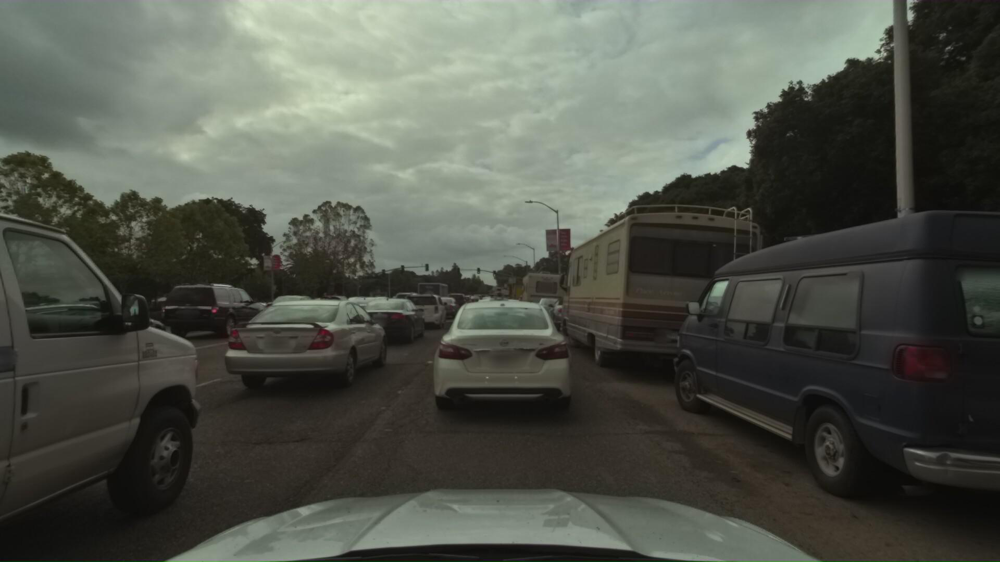

In [24]:
img = Image.open(cam_front['filename'])
img

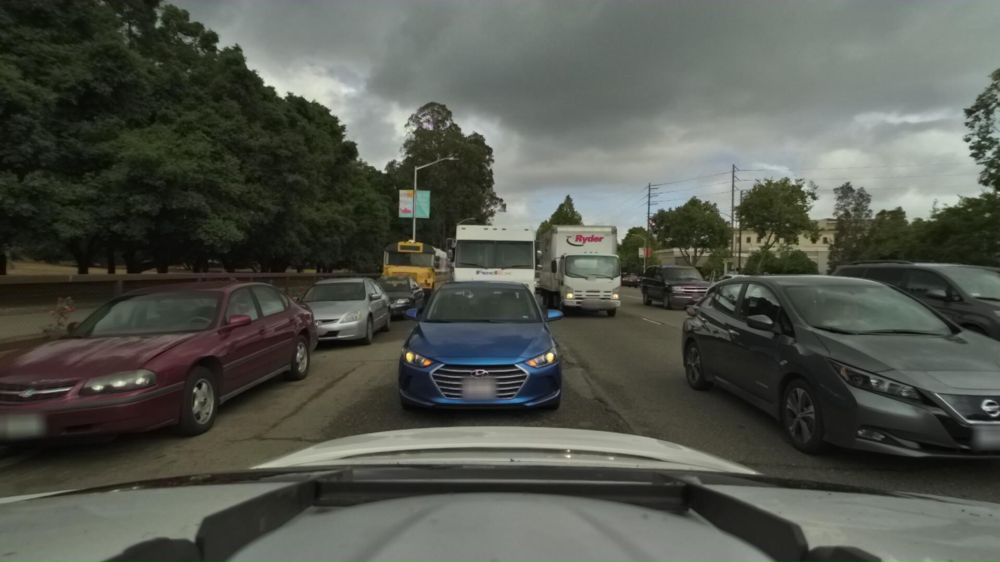

In [25]:
sensor = 'CAM_BACK'
cam_back = lyftdata.get('sample_data', my_sample['data'][sensor])
img = Image.open(cam_back['filename'])
img

## Use SDK's inbuilt render_sample_data to visualize cam_front data

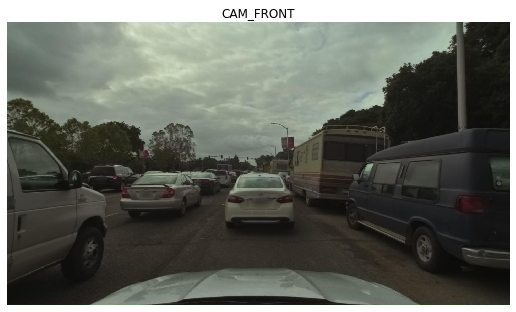

In [26]:
lyftdata.render_sample_data(cam_front['token'], with_anns=False)

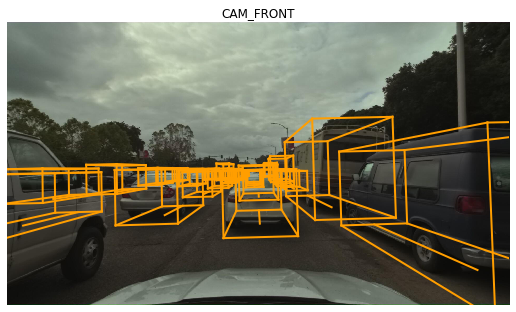

In [27]:
lyftdata.render_sample_data(cam_front['token'], with_anns=True)

# Project the lidar pointcloud into camera images

Sample: db8b47bd4ebdf3b3fb21598bb41bd8853d12f8d2ef25ce76edd4af4d04e49341

sample_data_token: bf374e60b6a1b0b9d4c0e3cf9e92b1f5d8401eae774ec1ebb3aa2f6bee59d1e5, mod: camera, channel: CAM_FRONT
sample_data_token: 521ca50fff810fcb6f70170f6a6b48709e55164902e34df1e8e3d95b5b56572e, mod: camera, channel: CAM_BACK_LEFT
sample_data_token: e35731e7cc91018cbafd323f635d97ccbd948642c19937b85521bd2f9918efcc, mod: camera, channel: CAM_FRONT_RIGHT
sample_data_token: 762f245c3f3a0cfe3a9bc97eb321eb71522eaff0904469693b9c712041fcf0a1, mod: camera, channel: CAM_BACK
sample_data_token: 89ef38638f8f4cbd932f693e934c4022681de809417a50679c9b20914286efb5, mod: camera, channel: CAM_BACK_RIGHT
sample_data_token: 0d3a497e9c99f8a4697e0e9d2644a8a7e3bd20143b58dba8285b63dd1715b794, mod: lidar, channel: LIDAR_FRONT_RIGHT
sample_data_token: a8b62cfacbdb74d34051f2ace4e3e89c8eb19bab1c8830ab16a5b671a3bc9971, mod: camera, channel: CAM_FRONT_LEFT
sample_data_token: f2f0d25a268a7a7112be881669bf0b4848ae591c8c70de1a8e562b81c45654

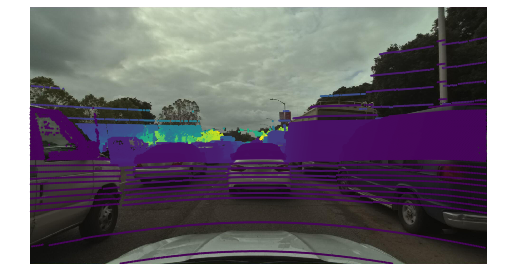

In [28]:
lyftdata.list_sample(my_sample['token'])
lyftdata.render_pointcloud_in_image(sample_token = my_sample["token"],
                                      dot_size = 1,
                                      camera_channel = 'CAM_FRONT')

## Show Lidar point data

In [29]:
lidar_top = lyftdata.get('sample_data', my_sample['data']['LIDAR_TOP']) # selecting LIDAR_TOP out of all LIDARs
lidar_top

{'is_key_frame': True,
 'prev': 'd8c2b6f50e7994c708174f077eaca66c92e7358a3cee6df32fc212b05de3c423',
 'fileformat': 'bin',
 'ego_pose_token': 'e36a9a1c02de786a9ac136640955071e1eda14659f5c75ce96b7dbc37ce52491',
 'timestamp': 1558109692502687.0,
 'next': 'a035b707c04a511ce924bdab277378a152467c778057656389eafa27875e9468',
 'token': 'f2f0d25a268a7a7112be881669bf0b4848ae591c8c70de1a8e562b81c45654d4',
 'sample_token': 'db8b47bd4ebdf3b3fb21598bb41bd8853d12f8d2ef25ce76edd4af4d04e49341',
 'filename': 'lidar/host-a101_lidar1_1242144892502687076.bin',
 'calibrated_sensor_token': '82130f5d48b806b62fec95989081337218fbf338ebcc95115d8afcebb305630c',
 'sensor_modality': 'lidar',
 'channel': 'LIDAR_TOP'}

In [30]:
# use LidarPointCloud to read LIDAR data files
pc = LidarPointCloud.from_file(Path(lidar_top['filename']))

In [31]:
pc.points.shape # x, y, z, intensity

(4, 106940)

In [32]:
axes_limits = [
    [-30, 50], # X axis range
    [-30, 20], # Y axis range
    [-3, 10]   # Z axis range
]
axes_str = ['X', 'Y', 'Z']

def display_frame_statistics(lidar_points, points=0.2):
    """
    Displays statistics for a single frame. Draws 3D plot of the lidar point cloud data and point cloud
    projections to various planes.
    
    Parameters
    ----------
    lidar_points: lidar data points 
    points          : Fraction of lidar points to use. Defaults to `0.2`, e.g. 20%.
    """
    
    points_step = int(1. / points)
    point_size = 0.01 * (1. / points)
    pc_range = range(0, lidar_points.shape[1], points_step)
    pc_frame = lidar_points[:, pc_range]
    def draw_point_cloud(ax, title, axes=[0, 1, 2]):
        """Convenient method for drawing various point cloud projections as a part of frame statistics"""
        ax.set_facecolor('black')
        ax.grid(False)
        ax.scatter(*pc_frame[axes, :], s=point_size, c='white', cmap='grey')
        if len(axes) == 3: # 3D configs
            text_color = 'white'
            ax.set_xlim3d([-10, 30])
            ax.set_ylim3d(*axes_limits[axes[1]])
            ax.set_zlim3d(*axes_limits[axes[2]])
            ax.set_zlabel('{} axis'.format(axes_str[axes[2]]), color='white')
        else: # 2D configs
            text_color = 'black' # the `figure` is white
            ax.set_xlim(*axes_limits[axes[0]])
            ax.set_ylim(*axes_limits[axes[1]])
        ax.set_title(title, color=text_color)
        ax.set_xlabel('{} axis'.format(axes_str[axes[0]]), color=text_color)
        ax.set_ylabel('{} axis'.format(axes_str[axes[1]]), color=text_color)
            
    # Draw point cloud data as 3D plot
    f2 = plt.figure(figsize=(15, 8))
    ax2 = f2.add_subplot(111, projection='3d')
    # make the panes transparent
    ax2.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
    ax2.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
    ax2.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
    draw_point_cloud(ax2, '3D plot')
    
    plt.show()
    plt.close(f2)
    # Draw point cloud data as plane projections
    f, ax3 = plt.subplots(3, 1, figsize=(15, 25))
#     f.set_facecolor('black')
    draw_point_cloud(
        ax3[0], 
        'XZ projection (Y = 0)', #, the car is moving in direction left to right', ?
        axes=[0, 2] # X and Z axes
    )
    draw_point_cloud(
        ax3[1], 
        'XY projection (Z = 0)', #, the car is moving in direction left to right',? 
        axes=[0, 1] # X and Y axes
    )
    draw_point_cloud(
        ax3[2], 
        'YZ projection (X = 0)', #, the car is moving towards the graph plane', ?
        axes=[1, 2] # Y and Z axes
    )
    plt.show()
    plt.close(f)

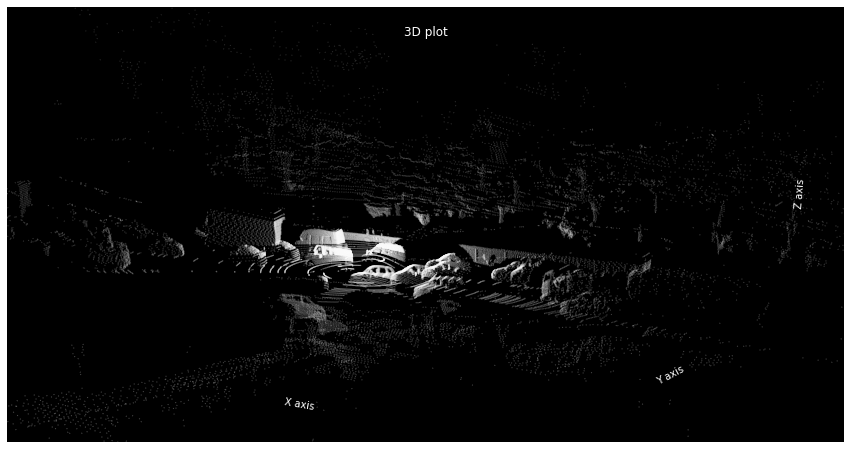

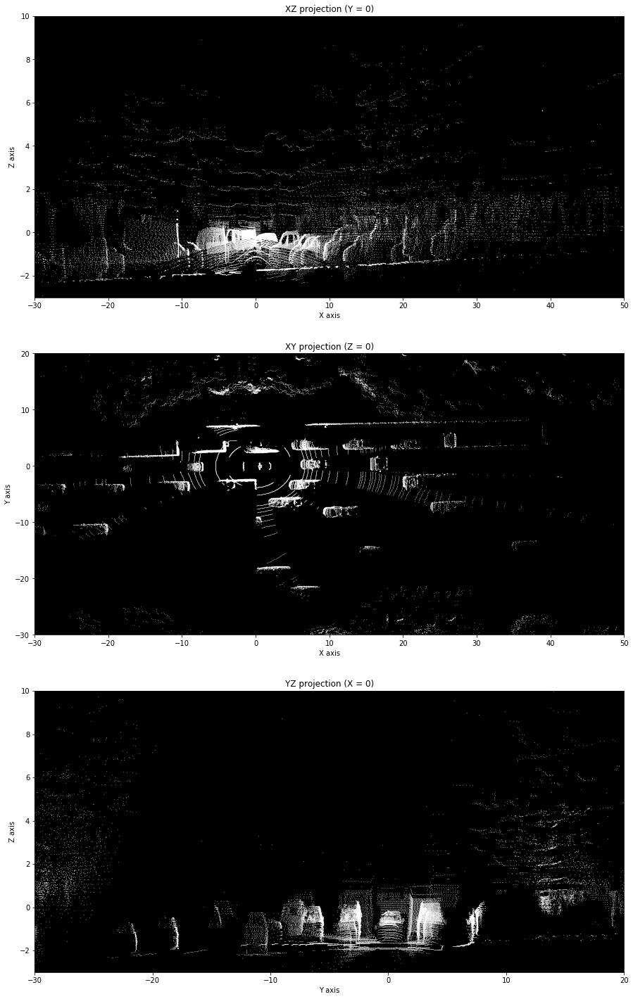

In [33]:
# show 3D plot/XZ/XY/YZ projections
display_frame_statistics(pc.points, points=0.5)

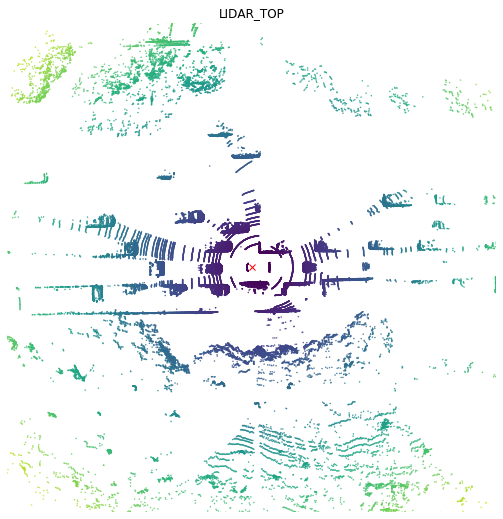

In [34]:
# use SDK's inbuilt render_sample_data to visualize lidar_top
lyftdata.render_sample_data(lidar_top['token'], with_anns=False)

lyftdata.render_sample_data(lidar_top['token'], with_anns=True)

# ego pose

In [35]:
# ego_pose contains information about the location (encoded in translation) and the orientation (encoded in rotation)
lyftdata.get('ego_pose', cam_front['ego_pose_token'])

{'rotation': [0.2781972991626702,
  -3.898219099753439e-05,
  0.010984161409140781,
  0.9604611441474988],
 'translation': [2706.450326057958, 694.5009240389028, -19.260889292536774],
 'token': 'dfba284cabe099bbe89ff13355a7702828d02709f82579f1e49081479cb09dfe',
 'timestamp': 1558109692502687.0}

##  calibrated_sensor

In [36]:
lyftdata.get('calibrated_sensor', cam_front['calibrated_sensor_token'])

{'sensor_token': 'eb9e8f60a3d6e3328d7512b9f8e6800127fe91f4d62bc8e48a0e6a7cb116cc60',
 'rotation': [0.5090416344726354,
  -0.49422295323980653,
  0.4930125688749941,
  -0.5035463174283287],
 'camera_intrinsic': [[1109.05239567, 0, 957.849065461],
  [0.0, 1109.05239567, 539.672710373],
  [0.0, 0.0, 1.0]],
 'translation': [1.5039405282244198, -0.02676183592864872, 1.6584901808053665],
 'token': '8e73e320d1fa9e5af96059e6eb1dd7d28e3271dea04de86ead47fa25fd13fd20'}

# Map

In [37]:
print("Map number:", len(lyftdata.map))

Map number: 1


In [38]:
#lyftdata.map[0]

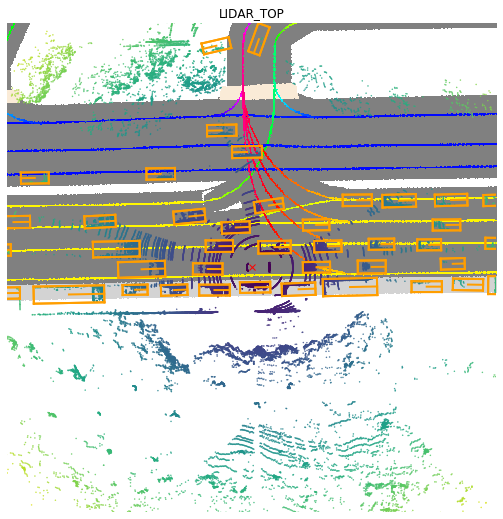

In [39]:
sensor_channel = 'LIDAR_TOP'
my_sample_data = lyftdata.get('sample_data', my_sample['data'][sensor_channel])
# The following call can be slow and requires a lot of memory
lyftdata.render_sample_data(my_sample_data['token'], underlay_map = True)

## Sample annotations

In [40]:
my_annotation = lyftdata.get('sample_annotation', my_sample['anns'][0])
my_annotation

{'token': '92bff46db1dbfc9679edc8091770c4256ac3c027e9f0a9c31dfc4fff41f6f677',
 'num_lidar_pts': -1,
 'size': [2.064, 5.488, 2.053],
 'sample_token': 'db8b47bd4ebdf3b3fb21598bb41bd8853d12f8d2ef25ce76edd4af4d04e49341',
 'rotation': [0.265491936795379, 0, 0, 0.964113080243515],
 'prev': 'db2c5aea69d8be40a746c5f3df9366e030189b07647212f338b31240c15896df',
 'translation': [2680.2830359778527, 698.1969292852777, -18.04776692365821],
 'num_radar_pts': 0,
 'attribute_tokens': ['1ba8c9a8bda54423fa710b0af1441d849ecca8ed7b7f9393ba1794afe4aa6aa2',
  'daf16a3f6499553cc5e1df4a456de5ee46e2e6b06544686d918dfb1ddb088f6f'],
 'next': '33e07b849d62718279c9548fe662d32247e319f0451cd461059305c3e42dcea0',
 'instance_token': 'abea2eb040d9c8fa1a44fa54020daaf9e2aa696e95e1d257481ecbf6e13a318c',
 'visibility_token': '',
 'category_name': 'car'}

In [41]:
# bounding boxes
my_box = lyftdata.get_box(my_annotation['token'])
my_box # Box class instance

label: nan, score: nan, xyz: [2680.28, 698.20, -18.05], wlh: [2.06, 5.49, 2.05], rot axis: [0.00, 0.00, 1.00], ang(degrees): 149.21, ang(rad): 2.60, vel: nan, nan, nan, name: car, token: 92bff46db1dbfc9679edc8091770c4256ac3c027e9f0a9c31dfc4fff41f6f677

In [42]:
my_box.center, my_box.wlh # center coordinates + width, length and height

(array([2680.28303598,  698.19692929,  -18.04776692]),
 array([2.064, 5.488, 2.053]))

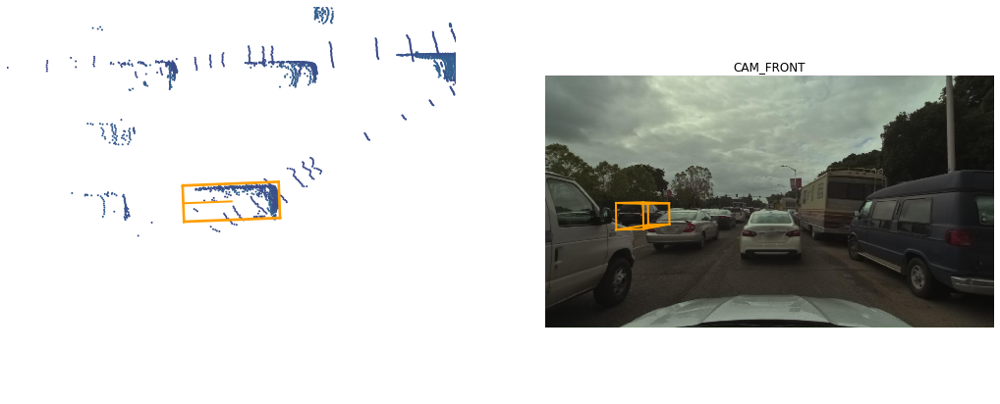

In [43]:
# show  a single object annotation
lyftdata.render_annotation(my_annotation['token'], margin=10)

In [44]:
my_attribute1 = lyftdata.get('attribute', my_annotation['attribute_tokens'][0])
my_attribute2 = lyftdata.get('attribute', my_annotation['attribute_tokens'][1])
print(my_attribute1)
print(my_attribute2)

{'description': '', 'token': '1ba8c9a8bda54423fa710b0af1441d849ecca8ed7b7f9393ba1794afe4aa6aa2', 'name': 'object_action_stopped'}
{'description': '', 'token': 'daf16a3f6499553cc5e1df4a456de5ee46e2e6b06544686d918dfb1ddb088f6f', 'name': 'is_stationary'}


## Instance 
generally track an instance across different frames in a particular scene. That's why it have first_annotation_token and last_annotation_token in my_instance

In [45]:
my_instance = lyftdata.get('instance', my_annotation['instance_token'])
my_instance

{'category_token': '8eccddb83fa7f8f992b2500f2ad658f65c9095588f3bc0ae338d97aff2dbcb9c',
 'last_annotation_token': '1b7d368056d75ac9082d30c84a4ffc2468cccc960aad11f1c171ec66390c8fff',
 'token': 'abea2eb040d9c8fa1a44fa54020daaf9e2aa696e95e1d257481ecbf6e13a318c',
 'first_annotation_token': '754eca53d8bce9fdc0da74ed71b35f83690bb8a8c8d5fa8e8d22d9d68031af33',
 'nbr_annotations': 100}

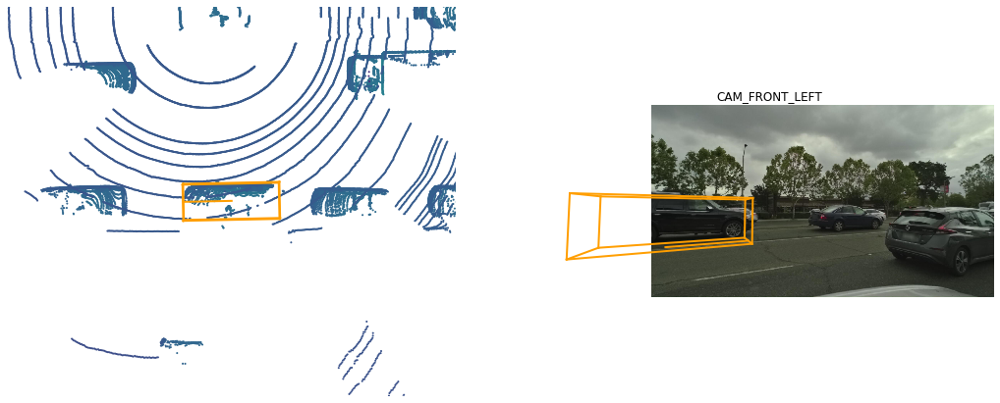

In [46]:
lyftdata.render_instance(my_instance['token'])

First annotated sample of this instance:


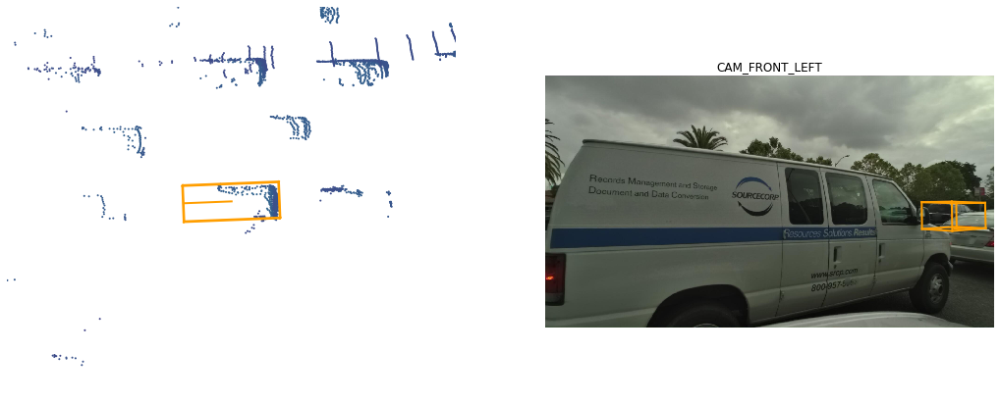

In [47]:
print("First annotated sample of this instance:")
lyftdata.render_annotation(my_instance['first_annotation_token'])

Last annotated sample of this instance


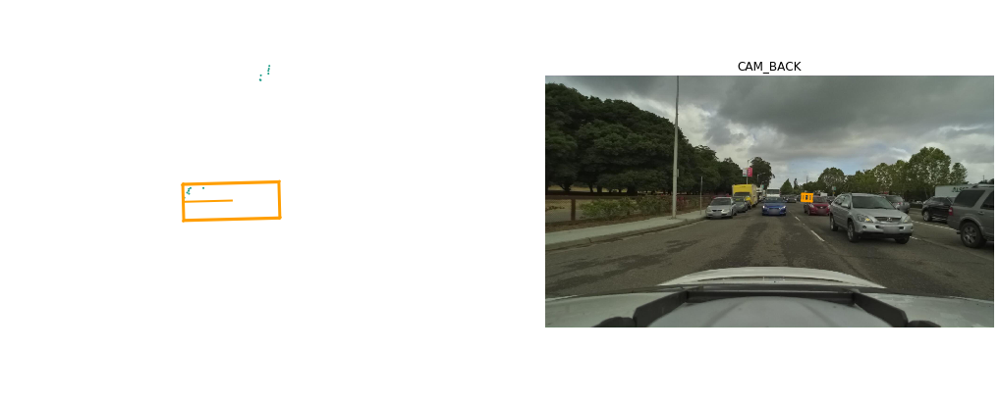

In [48]:
print("Last annotated sample of this instance")
lyftdata.render_annotation(my_instance['last_annotation_token'])

# Show all the images and lidar data of 1 sample.
Each sample data point has a bunch of images taken from different cameras, a bunch of lidar data points taken from different lidar sensors, 
it has annotations for the objects in those images, attributes associated with those annotations.

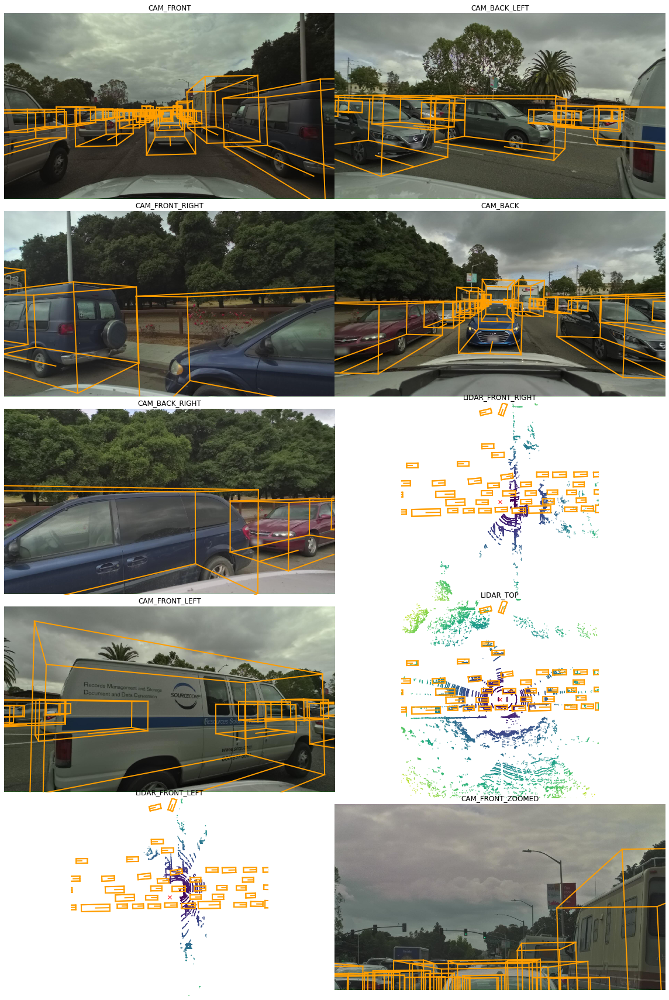

In [49]:
lyftdata.render_sample(token0)

# Render sample

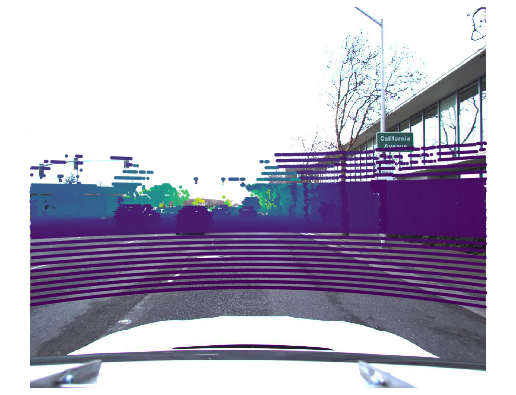

In [50]:
my_sample = lyftdata.sample[10]
lyftdata.render_pointcloud_in_image(my_sample['token'], pointsensor_channel='LIDAR_TOP')

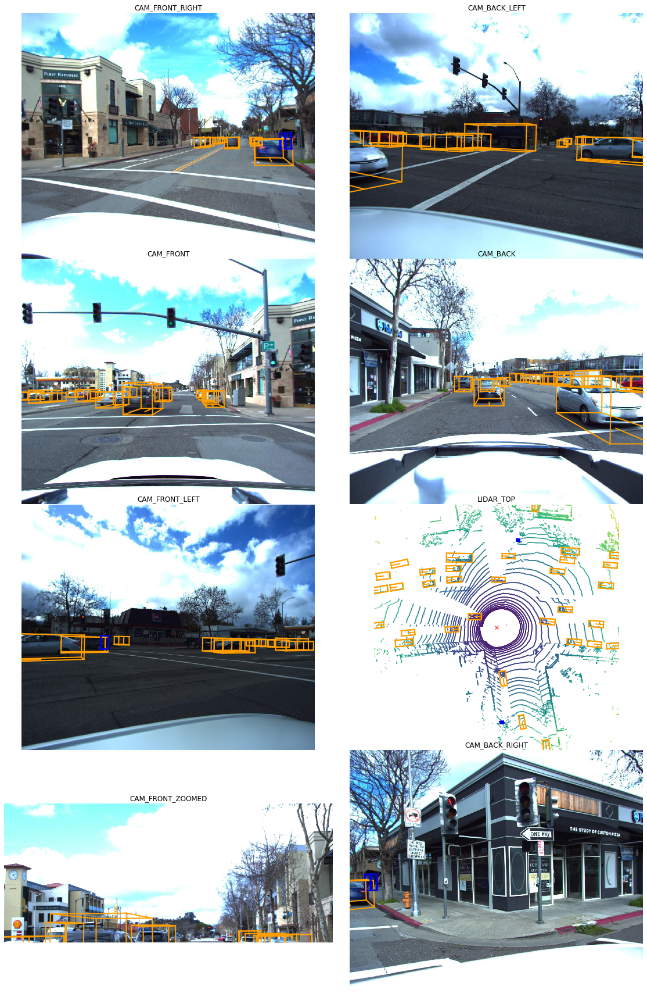

In [51]:
my_sample = lyftdata.sample[18]
lyftdata.render_sample(my_sample['token'])

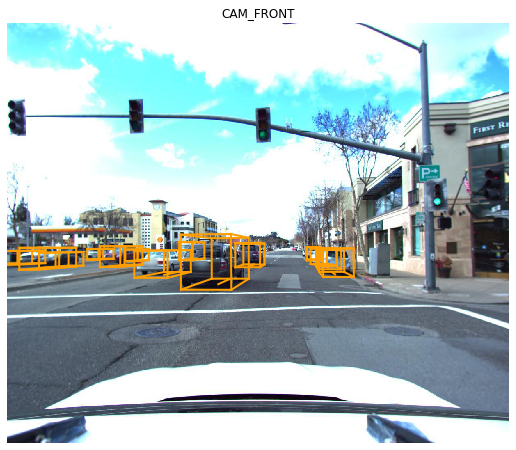

In [52]:
lyftdata.render_sample_data(my_sample['data']['CAM_FRONT'])

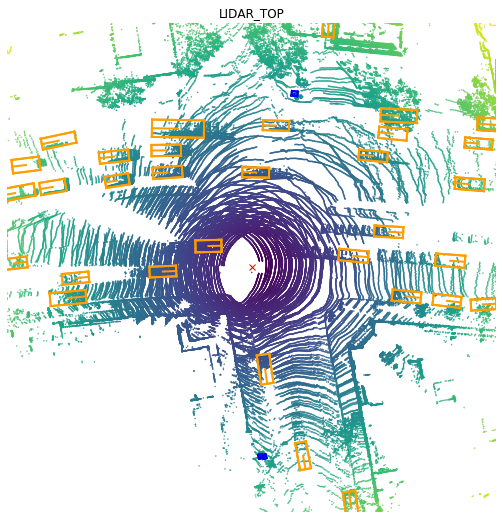

In [53]:
lyftdata.render_sample_data(my_sample['data']['LIDAR_TOP'], nsweeps=5)

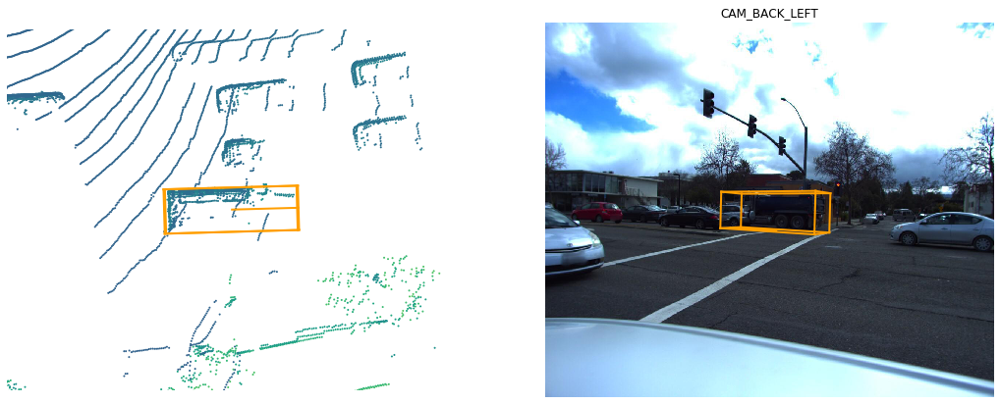

In [54]:
lyftdata.render_annotation(my_sample['anns'][22])

# 3D visualization of a scene

In [55]:
my_scene = lyftdata.get('scene',  my_sample['scene_token'])

In [56]:
def get_lidar_points(lidar_token):
    '''Get lidar point cloud in the frame of the ego vehicle'''
    sd_record = lyftdata.get("sample_data", lidar_token)
    sensor_modality = sd_record["sensor_modality"]
    
    # Get aggregated point cloud in lidar frame.
    sample_rec = lyftdata.get("sample", sd_record["sample_token"])
    chan = sd_record["channel"]
    ref_chan = "LIDAR_TOP"
    pc, times = LidarPointCloud.from_file_multisweep(
        lyftdata, sample_rec, chan, ref_chan, num_sweeps=1
    )
    # Compute transformation matrices for lidar point cloud
    cs_record = lyftdata.get("calibrated_sensor", sd_record["calibrated_sensor_token"])
    pose_record = lyftdata.get("ego_pose", sd_record["ego_pose_token"])
    vehicle_from_sensor = np.eye(4)
    vehicle_from_sensor[:3, :3] = Quaternion(cs_record["rotation"]).rotation_matrix
    vehicle_from_sensor[:3, 3] = cs_record["translation"]
    
    ego_yaw = Quaternion(pose_record["rotation"]).yaw_pitch_roll[0]
    rot_vehicle_flat_from_vehicle = np.dot(
        Quaternion(scalar=np.cos(ego_yaw / 2), vector=[0, 0, np.sin(ego_yaw / 2)]).rotation_matrix,
        Quaternion(pose_record["rotation"]).inverse.rotation_matrix,
    )
    vehicle_flat_from_vehicle = np.eye(4)
    vehicle_flat_from_vehicle[:3, :3] = rot_vehicle_flat_from_vehicle
    points = view_points(
        pc.points[:3, :], np.dot(vehicle_flat_from_vehicle, vehicle_from_sensor), normalize=False
    )
    return points

In [57]:
def plot_box(box, axis, view, colors, normalize=False, linewidth=1.0):
    '''Plot boxes in the 3d figure'''
    corners = view_points(box.corners(), view, normalize=normalize)#
    def draw_rect(selected_corners, color):
        prev = selected_corners[-1]
        for corner in selected_corners:
            axis.plot([prev[0], corner[0]], [prev[1], corner[1]], [prev[2], corner[2]], color=color, linewidth=linewidth)
            prev = corner

    # Draw the sides
    for i in range(4):
        axis.plot(
            [corners.T[i][0], corners.T[i + 4][0]],
            [corners.T[i][1], corners.T[i + 4][1]],
            [corners.T[i][2], corners.T[i + 4][2]],
            color=colors[2],
            linewidth=linewidth,
        )

    # Draw front (first 4 corners) and rear (last 4 corners) rectangles(3d)/lines(2d)
    draw_rect(corners.T[:4], colors[0]) #4x3
    draw_rect(corners.T[4:], colors[1])

In [58]:
def draw_3d_plot(idx, lidar_token):
    '''Plot the lidar + annotations on a 3D figure'''
    # sample lidar point cloud
    lidar_points = get_lidar_points(lidar_token)
    points = 0.5 # fraction of lidar_points to plot, to reduce the clutter
    points_step = int(1. / points)
    pc_range = range(0, lidar_points.shape[1], points_step)
    lidar_points = lidar_points[:, pc_range]
    
    # Get boxes, instead of current sensor's coordinate frame, use vehicle frame which is aligned to z-plane in world
    _, boxes, _ = lyftdata.get_sample_data(
        lidar_token, flat_vehicle_coordinates=True
    )
    fig = plt.figure(figsize=(15, 8))
    ax = fig.add_subplot(111, projection='3d')                    
    point_size = 0.01 * (1. / points) # size of the dots on plot
    ax.set_facecolor('black')
    ax.grid(False)
    ax.scatter(*lidar_points, s=point_size, c='white', cmap='gray')
    for box in boxes:
        c = np.array(lyftdata.explorer.get_color(box.name)) / 255.0
        plot_box(box, ax, view=np.eye(3), colors=(c, c, c), linewidth=0.5)
    ax.set_xlim3d(-40, 40)
    ax.set_ylim3d(-40, 40)
    ax.set_zlim3d(-4, 40)
    
    # make the panes transparent
    ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
    ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
    ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
    ax.set_title(lidar_token, color='white')
    filename = 'tmp/frame_{0:0>4}.png'.format(idx)
    plt.savefig(filename)
    plt.close(fig)
    return filename

In [59]:
!mkdir tmp

mkdir: cannot create directory ‘tmp’: File exists


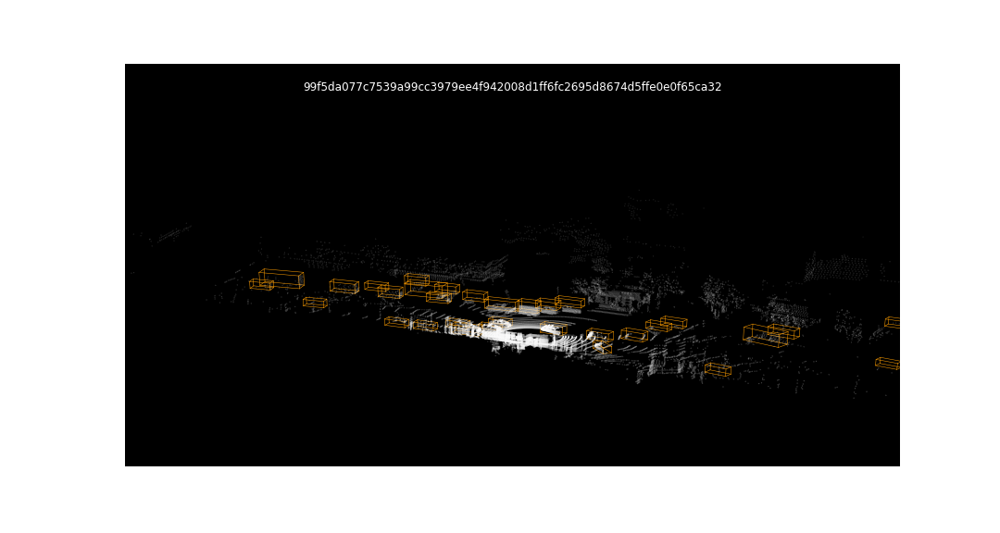

In [60]:
# take a quick look at the 3d Plot
first_sample_token = my_scene['first_sample_token']
sample = lyftdata.get('sample', first_sample_token)
lidar_token = sample['data']['LIDAR_TOP']
filename = draw_3d_plot(0, lidar_token)
Image.open(filename)

In [61]:
# visualize my_scene in the form of a video
frames = []
first_sample_token = my_scene['first_sample_token']
token = first_sample_token
for i in tqdm(range(my_scene['nbr_samples'])):
    sample = lyftdata.get('sample', token)
    lidar_token = sample['data']['LIDAR_TOP']
    filename = draw_3d_plot(i, lidar_token)
    frames += [filename]
    token = sample['next']

In [62]:
clip = ImageSequenceClip(frames, fps=5)
clip.write_gif('pcl_data.gif', fps=5);

t:   2%|▏         | 2/126 [00:00<00:10, 11.78it/s, now=None]

MoviePy - Building file pcl_data.gif with imageio.


In [63]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
from IPython import display

with open('pcl_data.gif','rb') as f:
    display.Image(data=f.read(), format='png')

In [64]:
# commented out because it tends to crash in notebooks
#lyftdata.render_scene(my_scene['token'])

In [65]:
# my_scene_token = lyftdata.scene[0]["token"]
# lyftdata.render_scene_channel(my_scene_token, 'CAM_FRONT')

In [66]:
#lyftdata.render_egoposes_on_map(log_location='Palo Alto')

# Convert lyft dataset to KITTI dataset

In [67]:
DATA_DIR = Path().absolute() 

In [69]:
DATA_DIR

PosixPath('/workspace/auto_driving/data/lyft_3d')

In [70]:
!pwd

/workspace/auto_driving/data/lyft_3d


In [71]:
# dir to write KITTY-style dataset
STORE_DIR = DATA_DIR.joinpath('kitti_format')

In [72]:
STORE_DIR

PosixPath('/workspace/auto_driving/data/lyft_3d/kitti_format')

In [106]:
#from utils.export_kitti import nuscenes_gt_to_kitti

/workspace/auto_driving/data/lyft_3d
